## Some recordings contain human voice

As @martinapreusse [said](https://www.kaggle.com/competitions/birdclef-2025/discussion/567551#3148665), 
> All recordings of the author Fabio A. Sarria-S contain a human voice.

Let's look at them and delete all unnecessary sounds!

In [1]:
import os
import librosa
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

In [2]:
dir = "/home/tomoya/kaggle/birdclef-2025/input/birdclef-2025"

submission_df = pd.read_csv(os.path.join(dir, "sample_submission.csv"))
taxonomy_df = pd.read_csv(os.path.join(dir, "taxonomy.csv"))
train_df = pd.read_csv(os.path.join(dir, "train.csv"))
with open(os.path.join(dir, "recording_location.txt"), "r") as file:
    recording_location = file.read()

## 1. Separate Fabio's recordings

In [3]:
fabio = train_df[train_df.author == 'Fabio A. Sarria-S'].copy()

print(f'We have {len(fabio)} Fabio\'s recordings in total')

We have 26 Fabio's recordings in total


## 2. Plot the avarage energy of the sound - we can clearly see the pattern

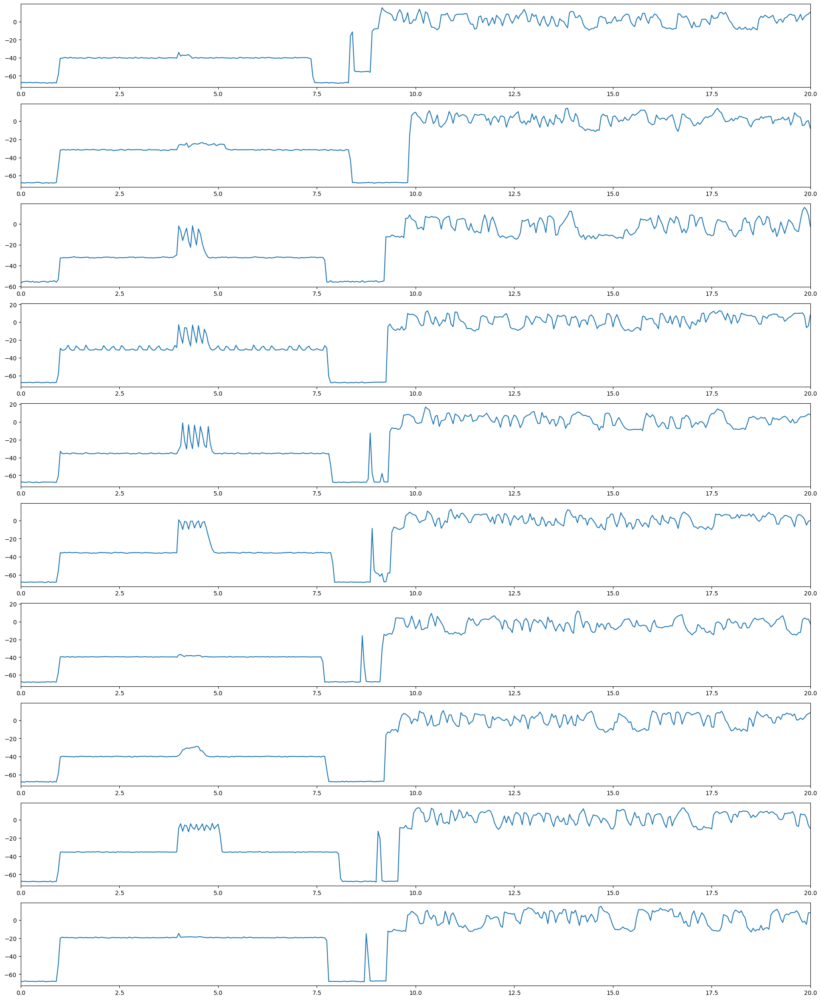

In [4]:
N = 10
chunk_len = 0.05 # Chunk len in seconds

fig, ax = plt.subplots(nrows=N)
fig.set_size_inches((24, 3 * N))
for n in range(N):
    # Load the data
    rec = fabio.iloc[n]
    wav, sr = librosa.load(f'{dir}/train_audio/{rec.filename}')

    # Calculate the sound power
    power = wav ** 2

    # Split the data into chunks and sum the energy in every chunk
    chunk = int(chunk_len * sr)

    pad = int(np.ceil(len(power) / chunk) * chunk - len(power))
    power = np.pad(power, (0, pad))
    power = power.reshape((-1, chunk)).sum(axis=1)

    t = np.arange(len(power)) * chunk_len
    ax[n].plot(t, 10 * np.log10(power))
    ax[n].set_xlim([0, 20])

The idea is to identify the points where the line intersects -50dB level the first and the second time

In [5]:
level = -50
N = 1
result = fabio['filename'].to_frame()

for n, rec in fabio.iterrows():
    # Load the data
    wav, sr = librosa.load(f'{dir}/train_audio/{rec.filename}')

    # Calculate the sound power
    power = wav ** 2

    # Split the data into chunks and sum the energy in every chunk
    chunk = int(chunk_len * sr)

    pad = int(np.ceil(len(power) / chunk) * chunk - len(power))
    power = np.pad(power, (0, pad))
    power = power.reshape((-1, chunk)).sum(axis=1)

    power_dB = 10 * np.log10(power)
    x = power_dB - level
    intersections = np.where(x[:-1] * x[1:] < 0)[0]
    a, b = intersections[:2]
    result.loc[result['filename'] == rec.filename, 'start'] = a * chunk_len
    result.loc[result['filename'] == rec.filename, 'stop'] = b * chunk_len

## 3. Display the result and check that it's reasonable

In [6]:
result.to_csv('fabio.csv', index=False)
display(result)

,filename,start,stop
0,1139490/CSA36385.ogg,0.95,7.35
1,1139490/CSA36389.ogg,0.95,8.35
2,1192948/CSA36358.ogg,0.95,7.70
3,1192948/CSA36366.ogg,0.95,7.75
4,1192948/CSA36373.ogg,0.95,7.85
5,1192948/CSA36388.ogg,0.95,7.90
34,1462711/CSA36371.ogg,0.95,7.65
35,1462711/CSA36379.ogg,0.95,7.70
36,1462711/CSA36390.ogg,0.95,8.05
37,1462737/CSA36341.ogg,0.90,7.75


## 4. Using VAD while exploring the other records. Quite good!

In [7]:
torch.set_num_threads(1)
model, (get_speech_timestamps, _, read_audio, _, _) = torch.hub.load(repo_or_dir='snakers4/silero-vad', model='silero_vad')

Using cache found in /home/tomoya/.cache/torch/hub/snakers4_silero-vad_master


We have 1 recordings by Alejandro Mendoza | Mónica Izquierdo in total


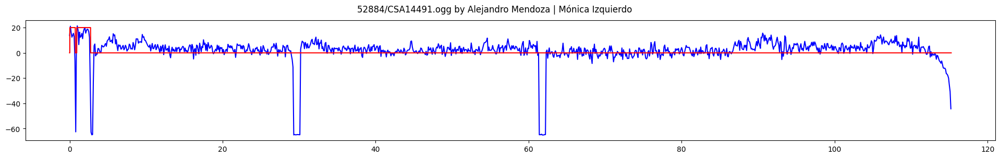

We have 7 recordings by Alexandra Buitrago-Cardona in total


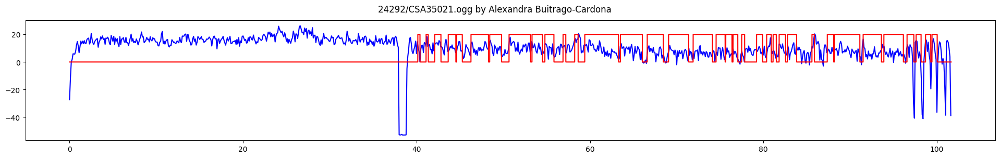

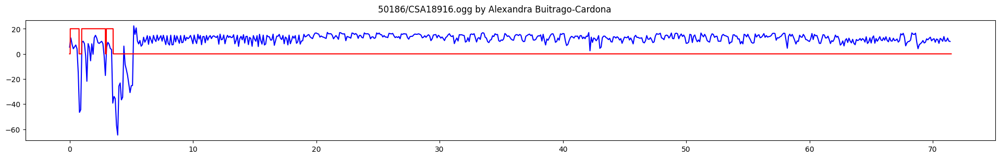

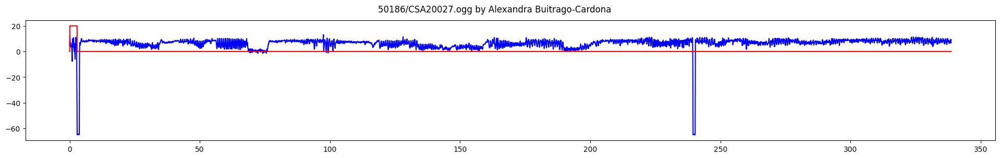

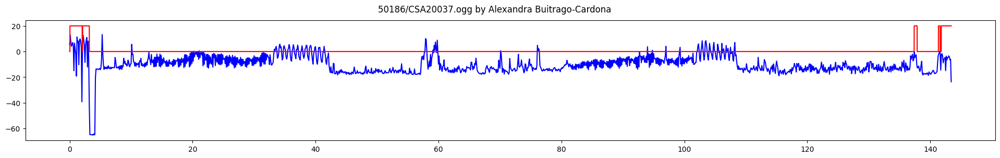

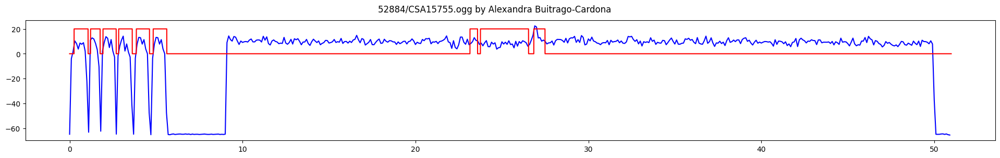

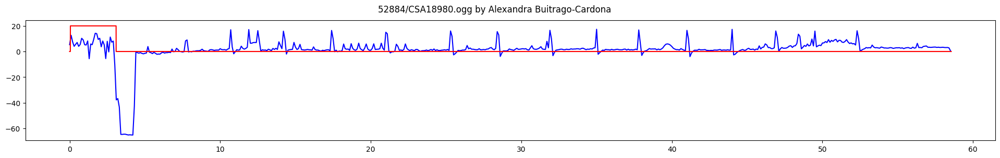

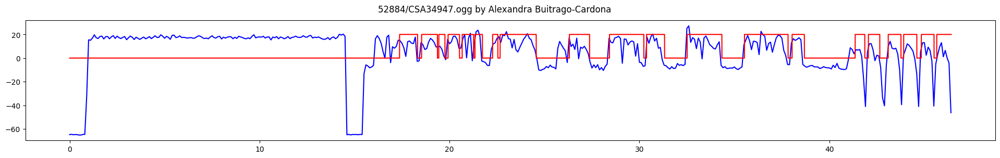

We have 6 recordings by Ana María Ospina-Larrea in total


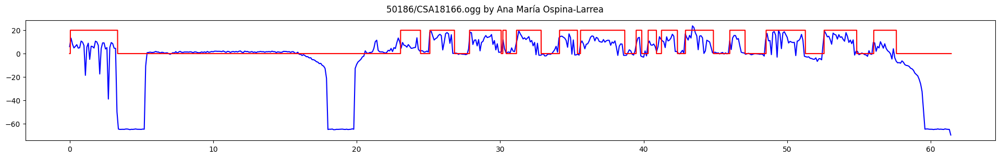

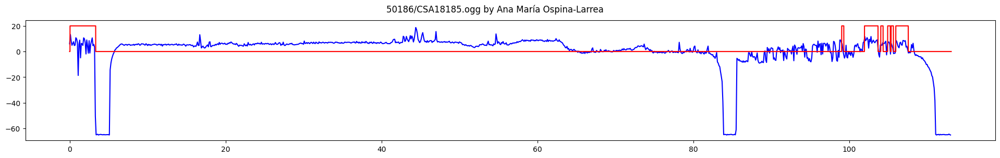

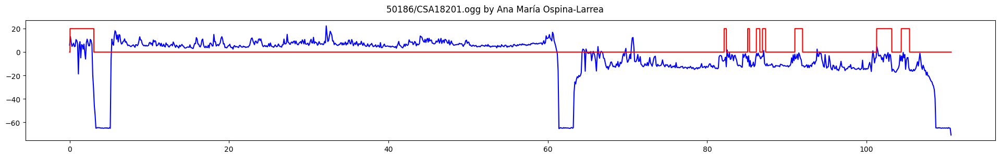

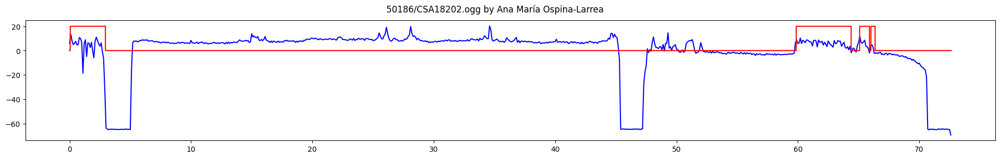

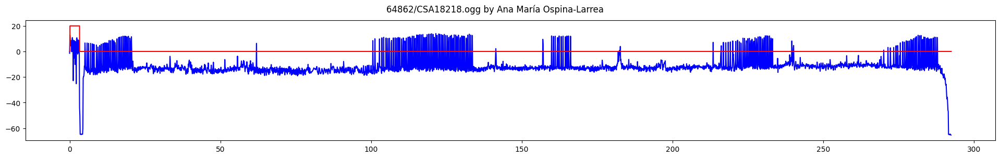

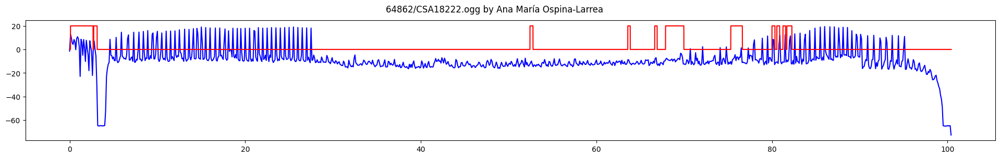

In [8]:
import IPython.display as ipd

df = train_df[train_df.collection == 'CSA'].copy()

author_map = {
    'Paula Caycedo-Rosales | Juan-Pablo López': 'Paula Caycedo-Rosales',
    'Ana María Ospina-Larrea | Daniela Murillo': 'Ana María Ospina-Larrea',
    'Eliana Barona-Cortés | Daniela García-Cobos': 'Eliana Barona-Cortés',
    'Eliana Barona- Cortés': 'Eliana Barona-Cortés',
    'Alexandra Butrago-Cardona': 'Alexandra Buitrago-Cardona',
    'Diego A Gómez-Morales': 'Diego A. Gomez-Morales',
}
author_map_func = lambda x: author_map[x] if x in author_map.keys() else x

df.author = df.author.map(author_map_func)
authors = sorted(df.author.unique())

# Here, I limit the output to 3 authors. Otherwise, the webpage becomes too heavy to load.
# If your are interested, please check the previous version of the notebook!
for author in authors[:3]:
    selection = df[df.author == author].copy()
    print(f'We have {len(selection)} recordings by {author} in total')

    N = len(selection)
    chunk_len = 0.1 # Chunk len in seconds

    for n in range(N):
        # Load the data
        rec = selection.iloc[n]
        fname = f'{dir}/train_audio/{rec.filename}'
        wav, sr = librosa.load(fname)

        # Calculate the sound power
        power = wav ** 2

        # Split the data into chunks and sum the energy in every chunk
        chunk = int(chunk_len * sr)

        pad = int(np.ceil(len(power) / chunk) * chunk - len(power))
        power = np.pad(power, (0, pad))
        power = power.reshape((-1, chunk)).sum(axis=1)

        speech_timestamps = get_speech_timestamps(torch.Tensor(wav), model)
        segmentation = np.zeros_like(wav)
        for st in speech_timestamps:
            segmentation[st['start']: st['end']] = 20

        fig = plt.figure(figsize=(24, 3))
        fig.suptitle(f'{rec.filename} by {rec.author}')

        t = np.arange(len(power)) * chunk_len
        plt.plot(t, 10 * np.log10(power), 'b')

        t = np.arange(len(segmentation)) / sr
        plt.plot(t, segmentation, 'r')
        plt.show()

        display(ipd.Audio(fname))

# 6. Now, is there any voice in the train soundscapes?

As @tomok1 [proposed](https://www.kaggle.com/competitions/birdclef-2025/discussion/568886#3154723), the default threshold of 0.5 may be lowered to 0.4.

In [10]:
from glob import glob
import pickle

files = sorted(glob(f'{dir}/train_audio/*/*.ogg'))
voice_data = {}
for fname in files:
    wav = read_audio(fname)
    speech_timestamps = get_speech_timestamps(wav, model, return_seconds=True, threshold=0.5)
    if len(speech_timestamps):
        voice_data[fname] = speech_timestamps

        with open('/home/tomoya/kaggle/birdclef-2025/output/eda/train_voice_summary.txt', 'a') as f:
            f.write(f'{fname}\n')

with open('/home/tomoya/kaggle/birdclef-2025/output/eda/train_voice_data.pkl', 'wb') as f:
    pickle.dump(voice_data, f)

In [11]:
from glob import glob
import pickle

files = sorted(glob(f'{dir}/train_soundscapes/*.ogg'))
voice_data = {}
for fname in files:
    wav = read_audio(fname)
    speech_timestamps = get_speech_timestamps(wav, model, return_seconds=True, threshold=0.5) # default threshold
    if len(speech_timestamps):
        voice_data[fname] = speech_timestamps

        with open('/home/tomoya/kaggle/birdclef-2025/output/eda/ss_voice_summary.txt', 'a') as f:
            f.write(f'{fname}\n')

with open('/home/tomoya/kaggle/birdclef-2025/output/eda/ss_voice_data.pkl', 'wb') as f:
    pickle.dump(voice_data, f)